In [1]:
import pandas as pd
import seaborn as sb
import math
import numpy as np
import os
import re
import jenkspy

import postProcessing
import matplotlib.pyplot as plt

## Reading files

In [2]:
df1 = pd.read_csv("df_mfeatures.csv")
df2 = pd.read_csv("df_ensemble_allfeatures.csv")

binDF = pd.read_csv("BinnedMetaFeatures.csv")

In [3]:
map_categories = {
    'MI': 'Information', 
    'GR': 'Information', 
    'fcbf': 'Information',
    'chisquare': 'Dependency', 
    'mrmr': 'Dependency', 
    'cfs': 'Dependency',
    'relieff': 'Distance', 
    'relief': 'Distance', 
    'multisurf': 'Distance'
}


In [4]:
df2['FeatureAlgo'] = df2['FeatureAlgo'].replace(map_categories)

In [5]:
df2['FeatureAlgo'].value_counts()

Information    522
Distance       522
Dependency     522
Name: FeatureAlgo, dtype: int64

In [6]:
df_new = df1[['File', 'Completeness', 'Conciseness', 'cor.mean', 'cov.mean',
       'eigenvalues.mean', 'g_mean.mean', 'h_mean.mean', 'iq_range.mean', 'kurtosis.mean', 
       'mad.mean', 'max.mean', 'mean.mean', 'median.mean', 'min.mean', 'nr_cor_attr',
       'nr_norm', 'nr_outliers', 'range.mean', 'sd.mean', 'skewness.mean',
       'sparsity.mean', 't_mean.mean',   'var.mean', 'ClassImbRatio',
       'ClassOverlapPerc', 'OutlierPerc', 'attr_to_inst', 'inst_to_attr', 'nr_attr',
        'nr_bin',  'nr_inst', 'nr_num', 'attr_conc.mean', 'attr_ent.mean', 'ena', 'nUnique' ,'snr.mean', 'cEntropy','LabelIssuesPerc']] #SyntaxAccuracy removed

df_bin_new = binDF[['Completeness_bins', 'Conciseness_bins',  'cor.mean_bins', 'cov.mean_bins', 
              'eigenvalues.mean_bins', 'g_mean.mean_bins', 'h_mean.mean_bins', 'iq_range.mean_bins', 'kurtosis.mean_bins',
              'mad.mean_bins', 'max.mean_bins',  'mean.mean_bins', 'median.mean_bins',  'min.mean_bins', 'nr_cor_attr_bins', 
              'nr_norm_bins', 'nr_outliers_bins', 'range.mean_bins', 'sd.mean_bins', 'skewness.mean_bins',
              'sparsity.mean_bins', 't_mean.mean_bins', 'var.mean_bins', 'LabelIssues_bins', 'ClassImbRatio_bins', 
              'OutlierPerc_bins', 'ClassOverlapPerc_bins', 'attr_to_inst_bins', 'inst_to_attr_bins', 'nr_attr_bins',
              'nr_inst_bins', 'nr_num_bins', 'nr_bin_bins', 'attr_conc.mean_bins', 'cEntropy_bins', 'ena_bins', 'snr.mean_bins', 'nUnique_bins','attr_ent.mean_bins', 'File']] #'SyntaxAccuracy_bins' removed

In [8]:
len(df_new.columns)

40

In [9]:
def extract_rows(df, alpha, beta, sort):
    earr = []
    fmrr = []
    fwrr = []
    no_of_feature_algo = 6
    total_comb = no_of_feature_algo * (no_of_feature_algo-1)

    df['F1 macro'] = (2*df['Precision macro']*df['Recall macro']) / (df['Precision macro'] + df['Recall macro'])
    df['F1 weight'] = (2*df['Precision weight']*df['Recall weight']) / (df['Precision weight'] + df['Recall weight'])
    x = 1
    count = 0
    for i in range(0, df.shape[0]): #dataset
      tempfmrr = []
      tempfwrr = []
      tempearr = []
      for j in range(6):
        if (i!=j+6*(x-1)):
     
          tempfmrr.append((df['F1 macro'][i] / df['F1 macro'][j+6*(x-1)])
                          / ( 1 + (alpha* math.log(df['Time FS'][i] / df['Time FS'][j+6*(x-1)])) +
                          ( beta * math.log(df['Features'][i]/ df['Features'][j+6*(x-1)]))))
          tempfwrr.append((df['F1 weight'][i] / df['F1 weight'][j+6*(x-1)]) /
                          ( 1 + (alpha* math.log(df['Time FS'][i] / df['Time FS'][j+6*(x-1)])) +
                                      ( beta * math.log(df['Features'][i]/ df['Features'][j+6*(x-1)]))))
          tempearr.append((df['Accuracy'][i] / df['Accuracy'][j+6*(x-1)]) /
           ( 1 + (alpha* math.log(df['Time FS'][i] / df['Time FS'][j+6*(x-1)])) +
                          ( beta * math.log(df['Features'][i]/ df['Features'][j+6*(x-1)]))))
          count=count+1

          if count==total_comb:
            x=x+1
            count=0
            break
      earr.append(sum(tempearr)/5)
      fmrr.append(sum(tempfmrr)/5)
      fwrr.append(sum(tempfwrr)/5)
    df['earr'] = earr
    df['fmrr'] = fmrr
    df['fwrr'] = fwrr
    df1 = df.sort_values(['File',sort], ascending=[1,0])
    df3 = df1.iloc[::9, :]
    return df3

## Extract FS technique based on  EARR, FWRR and FMRR

In [10]:
root = './optimalalphabeta/dfmrr_bin_evaluation/'
for i in np.arange(0, 0.11, 0.02):
  for j in np.arange(0,0.11, 0.02):
    df_optimal = extract_rows(df2, i, j, 'fmrr')
    merge_features = pd.merge(df_new, df_optimal[['File','FeatureAlgo']], on=['File'])
    merge_features.to_csv(root+"dffmrr"+str(i)+"_"+str(j)+".csv", index=False)

In [ ]:
root = './optimalalphabeta/dfmrr_cont_evaluation/'
for i in np.arange(0, 0.11, 0.02):
  for j in np.arange(0,0.11, 0.02):
    df_optimal = extract_rows(df2, i, j, 'fmrr')
    merge_features = pd.merge(df_new, df_optimal[['File','FeatureAlgo']], on=['File'])
    merge_features.to_csv(root+"dffmrr"+str(i)+"_"+str(j)+".csv", index=False)

In [11]:
root = './optimalalphabeta/dearr_bin_evaluation/'
for i in np.arange(0, 0.11, 0.02):
  for j in np.arange(0,0.11, 0.02):
    df_optimal = extract_rows(df2, i, j, 'earr')
    merge_features = pd.merge(df_new, df_optimal[['File','FeatureAlgo']], on=['File'])
    merge_features.to_csv(root+"dfearr"+str(i)+"_"+str(j)+".csv", index=False)

In [ ]:
root = './optimalalphabeta/dearr_cont_evaluation/'
for i in np.arange(0, 0.11, 0.02):
  for j in np.arange(0,0.11, 0.02):
    df_optimal = extract_rows(df2, i, j, 'earr')
    merge_features = pd.merge(df_new, df_optimal[['File','FeatureAlgo']], on=['File'])
    merge_features.to_csv(root+"dfearr"+str(i)+"_"+str(j)+".csv", index=False)

In [ ]:
root = './optimalalphabeta/dfwrr_bin_evaluation/'
for i in np.arange(0, 0.11, 0.02):
  for j in np.arange(0,0.11, 0.02):
    df_optimal = extract_rows(df2, i, j, 'fwrr')
    merge_features = pd.merge(df_new, df_optimal[['File','FeatureAlgo']], on=['File'])
    merge_features.to_csv(root+"dffwrr"+str(i)+"_"+str(j)+".csv", index=False)

In [ ]:
root = './optimalalphabeta/dfwrr_cont_evaluation/'
for i in np.arange(0, 0.11, 0.02):
  for j in np.arange(0,0.11, 0.02):
    df_optimal = extract_rows(df2, i, j, 'fwrr')
    merge_features = pd.merge(df_new, df_optimal[['File','FeatureAlgo']], on=['File'])
    merge_features.to_csv(root+"dffwrr"+str(i)+"_"+str(j)+".csv", index=False)

## Identification of alpha and beta threshold

In [19]:
import pandas as pd 
import numpy as np 
from sklearn.preprocessing import LabelEncoder

from sklearn import preprocessing
from sklearn.svm import LinearSVC
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import f1_score
from sklearn.feature_selection import VarianceThreshold
from sklearn.model_selection import cross_val_score, ShuffleSplit
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV, train_test_split

from sklearn import preprocessing

In [20]:
def calcu_scores(df):
    scores = []
    labels = df['FeatureAlgo']
    features = df.drop(['FeatureAlgo', 'File'], axis=1)

    le = LabelEncoder()
    features = features.apply(le.fit_transform)
    X_train, X_test, y_train, y_test = train_test_split(features, labels, random_state=42, train_size=0.8)

    # Parameter grids for GridSearchCV
    param_grid_mlp = {
        'hidden_layer_sizes': [(50,50,50), (50,100,50), (100,)],
        'solver': ['sgd', 'adam'],
        'alpha': [0.0001, 0.05],
        'max_iter': [100, 200, 500]
    }

    param_grid_lr = {
        'penalty': ['l1', 'l2'],
        'C': [0.01, 0.1, 1, 10, 100],
        'solver': ['lbfgs', 'saga']
    }

    param_grid_svc = {
        'C': [0.01, 0.1, 1, 10, 100],
        'max_iter': [1000, 2000, 3000]
    }

    param_grid_dt = {'max_features': ['auto', 'sqrt', 'log2'],
              'ccp_alpha': [0.1, .01, .001],
              'max_depth' : [5, 7, 9],
              'criterion' :['gini', 'entropy']
             }

    # GridSearchCV for each classifier
    mlp_clf = GridSearchCV(MLPClassifier(random_state=1), param_grid_mlp, cv=5)
    lr_clf = GridSearchCV(LogisticRegression(random_state=0, max_iter=1000), param_grid_lr, cv=5)
    dt_clf = GridSearchCV(DecisionTreeClassifier(), param_grid_dt, cv=5)
    svc_clf = GridSearchCV(LinearSVC(random_state=0), param_grid_svc, cv=5)

    mlp_clf.fit(X_train, y_train)
    lr_clf.fit(X_train, y_train)
    dt_clf.fit(X_train, y_train)
    svc_clf.fit(X_train, y_train)

    # Predictions
    mlp_predicted = mlp_clf.predict(X_test)
    lr_predicted = lr_clf.predict(X_test)
    dt_predicted = dt_clf.predict(X_test)
    svc_predicted = svc_clf.predict(X_test)

    # Append F1 scores
    for clf_name, predicted in zip(
        ['MLP', 'LR', 'RF', 'SVC'],
        [mlp_predicted, lr_predicted, dt_predicted, svc_predicted]
    ):
        scores.append(f1_score(predicted, y_test, average='macro'))
        scores.append(f1_score(predicted, y_test, average='micro'))
        scores.append(f1_score(predicted, y_test, average='weighted'))

    return scores

In [24]:
abs_path = os.getcwd()+'/optimalalphabeta/dfmrr_cont/'

filepaths  = [os.path.join(abs_path, name) for name in os.listdir(abs_path)]
all_files = []

for path in filepaths:
    temp = []
    df = pd.read_csv(path)
    temp.append(path)
    temp.extend((calcu_scores(df)))
    all_files.append(temp)

pd.DataFrame(all_files).to_csv("fmrr_cont_evaluation_analysis.csv", index=False, header=['File', 'MLP_macro','MLP_micro','MLP_weighted','LR_macro','LR_micro','LR_weighted','DT_macro','DT_micro','DT_weighted', 'SVC_macro','SVC_micro','SVC_weighted'])

/home/d19125691/.local/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:617: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/d19125691/.local/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:617: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/d19125691/.local/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:617: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/d19125691/.local/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:617: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't conver

In [26]:
abs_path = os.getcwd()+'/optimalalphabeta/dfwrr_cont/'

filepaths  = [os.path.join(abs_path, name) for name in os.listdir(abs_path)]
all_files = []

for path in filepaths:
    temp = []
    df = pd.read_csv(path)
    temp.append(path)
    temp.extend((calcu_scores(df)))
    all_files.append(temp)

pd.DataFrame(all_files).to_csv("fwrr_cont_evaluation_analysis.csv",  index=False, header=['File', 'MLP_macro','MLP_micro','MLP_weighted','LR_macro','LR_micro','LR_weighted','DT_macro','DT_micro','DT_weighted', 'SVC_macro','SVC_micro','SVC_weighted'])

/home/d19125691/.local/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:617: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/d19125691/.local/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:617: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/d19125691/.local/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:617: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/d19125691/.local/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:617: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't conver

In [25]:
abs_path = os.getcwd()+'/optimalalphabeta/dearr_cont/'

filepaths  = [os.path.join(abs_path, name) for name in os.listdir(abs_path)]
all_files = []

for path in filepaths:
    temp = []
    df = pd.read_csv(path)
    temp.append(path)
    temp.extend((calcu_scores(df)))
    all_files.append(temp)

pd.DataFrame(all_files).to_csv("earr_cont_evaluation_analysis.csv",  index=False, header=['File', 'MLP_macro','MLP_micro','MLP_weighted','LR_macro','LR_micro','LR_weighted','DT_macro','DT_micro','DT_weighted', 'SVC_macro','SVC_micro','SVC_weighted'])

/home/d19125691/.local/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:617: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/d19125691/.local/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:617: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/d19125691/.local/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:617: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/home/d19125691/.local/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:617: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't conver

/home/d19125691/.local/lib/python3.6/site-packages/ipykernel_launcher.py:27: UserWarning: Legend does not support 'Dependency' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
/home/d19125691/.local/lib/python3.6/site-packages/ipykernel_launcher.py:27: UserWarning: Legend does not support 'Distance' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
/home/d19125691/.local/lib/python3.6/site-packages/ipykernel_launcher.py:27: UserWarning: Legend does not support 'Information' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists


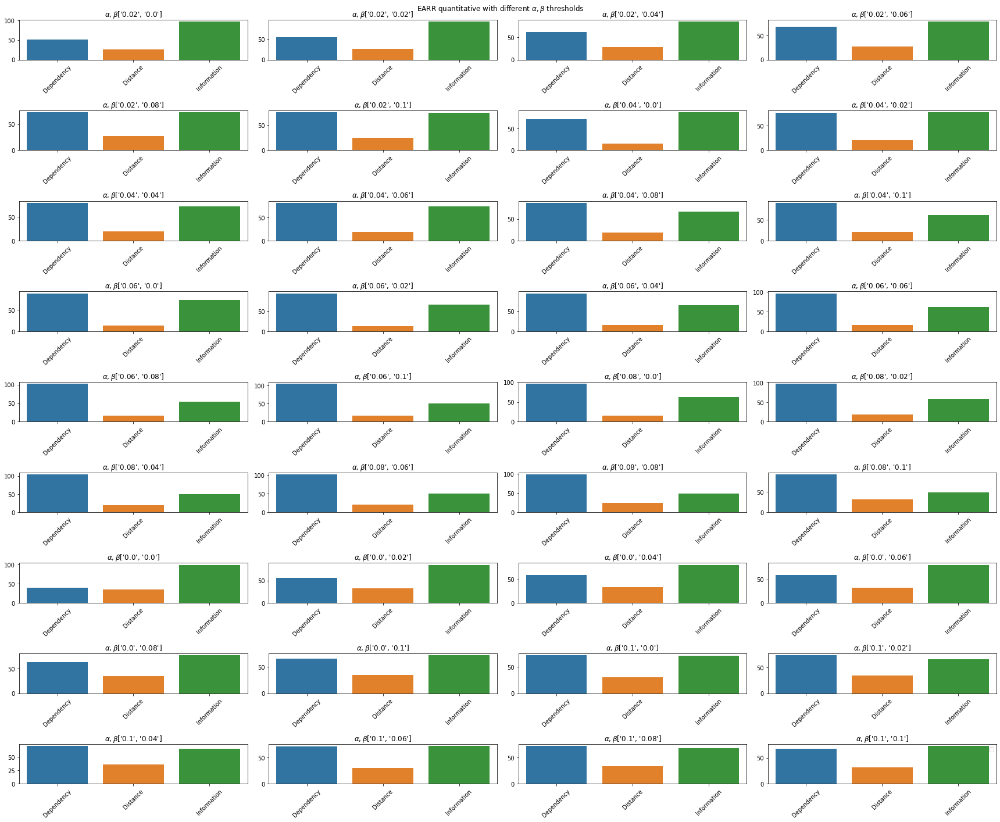

In [30]:
import seaborn as sns
import os
import re

fig,axes  = plt.subplots(nrows=9, ncols=4, figsize=(24,20), tight_layout=True)
fig.suptitle('EARR quantitative with different '+r'$\alpha, \beta$'+' thresholds')

k=0
j = 0
allFiles = []

abs_path = os.getcwd()+'/optimalalphabeta/dearr_bin_evaluation/'
for files in sorted(os.listdir(abs_path)):
    df = pd.read_csv(os.path.join(abs_path, files))
    x_ticks = df['FeatureAlgo'].value_counts().sort_index().index.tolist()
    sns.barplot(ax=axes[k][j], x=df['FeatureAlgo'].value_counts().sort_index().index.tolist(), 
    y=df['FeatureAlgo'].value_counts().sort_index().values.tolist()).set(title=r'$\alpha, \beta$' + '{}'.format(str(re.findall("\d+\.\d+", files))))
    axes[k][j].set_xticklabels(labels=x_ticks, rotation=45)
    #plt.title('FSA of {}'.format(str(re.findall("\d+\.\d+", files))))
   # plt.subplots_adjust(hspace=None)
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)

    j = j+1
    if(j==4):
        k=k+1
        j=0
plt.legend((df['FeatureAlgo'].value_counts().sort_index().index.tolist()), df['FeatureAlgo'].value_counts().sort_index().index.tolist())


#plt.tight_layout()

    #print(df['FeatureAlgo'].value_counts())

/home/d19125691/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: Legend does not support 'GR' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
/home/d19125691/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: Legend does not support 'MI' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
/home/d19125691/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: Legend does not support 'cfs' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
/home/d19125691/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: Legend does not support 'chisquare' 

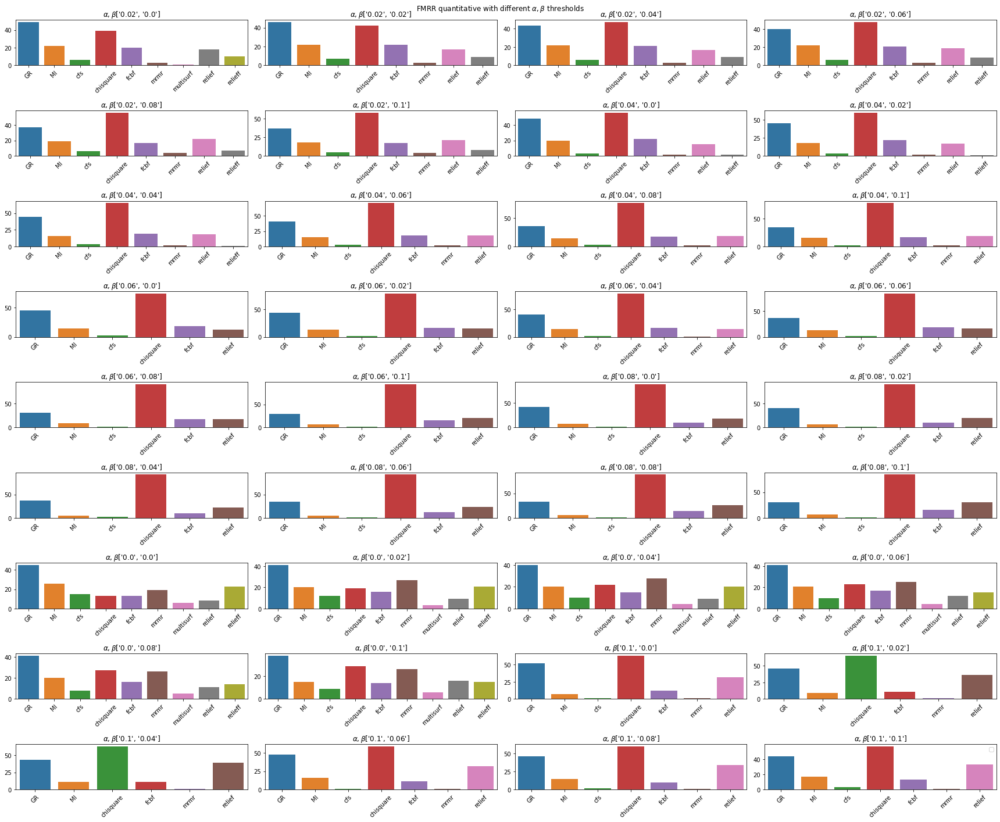

In [23]:
fig,axes  = plt.subplots(nrows=9, ncols=4, figsize=(24,20), tight_layout=True)
fig.suptitle('FMRR quantitative with different '+r'$\alpha, \beta$'+' thresholds')

k=0
j = 0
allFiles = []

abs_path = os.getcwd()+'/optimalalphabeta/dfmrr_bin/'
for files in sorted(os.listdir(abs_path)):
    df = pd.read_csv(os.path.join(abs_path, files))
    x_ticks = df['FeatureAlgo'].value_counts().sort_index().index.tolist()
    sns.barplot(ax=axes[k][j], x=df['FeatureAlgo'].value_counts().sort_index().index.tolist(), 
    y=df['FeatureAlgo'].value_counts().sort_index().values.tolist()).set(title=r'$\alpha, \beta$' + '{}'.format(str(re.findall("\d+\.\d+", files))))
    axes[k][j].set_xticklabels(labels=x_ticks, rotation=45)
    #plt.title('FSA of {}'.format(str(re.findall("\d+\.\d+", files))))
   # plt.subplots_adjust(hspace=None)
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)

    j = j+1
    if(j==4):
        k=k+1
        j=0
plt.legend((df['FeatureAlgo'].value_counts().sort_index().index.tolist()), df['FeatureAlgo'].value_counts().sort_index().index.tolist())


#plt.tight_layout()

    #print(df['FeatureAlgo'].value_counts())

/home/d19125691/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: Legend does not support 'Dependency' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
/home/d19125691/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: Legend does not support 'Distance' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
/home/d19125691/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: Legend does not support 'Information' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists


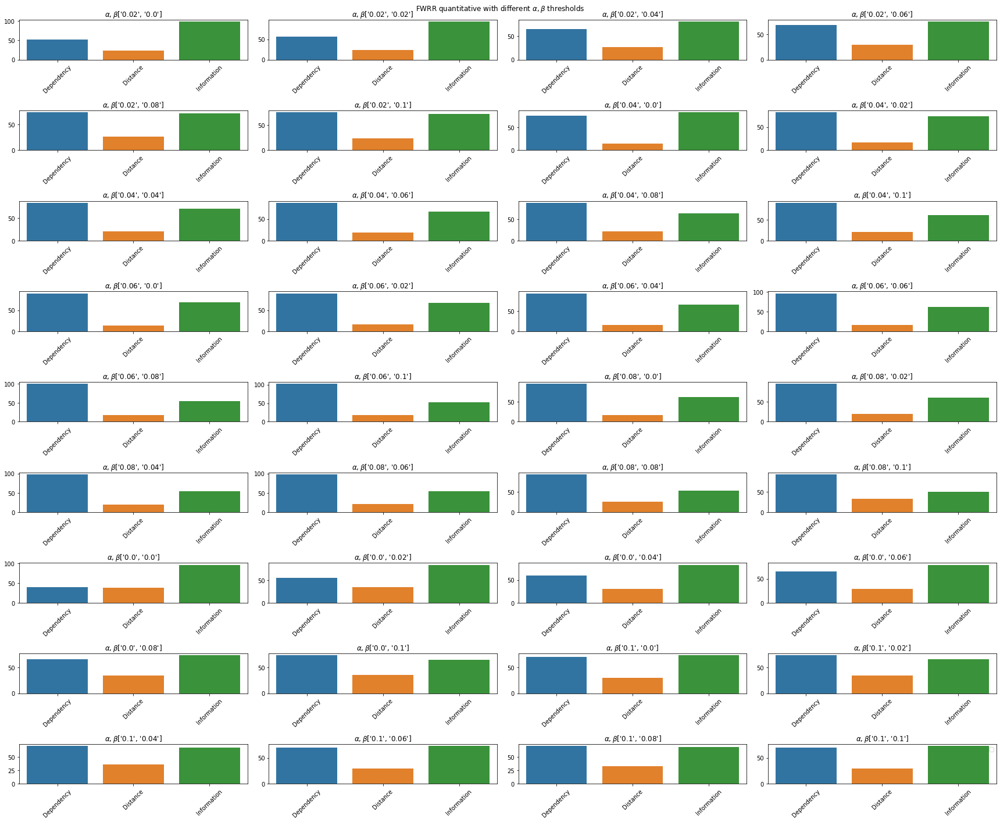

In [29]:
fig,axes  = plt.subplots(nrows=9, ncols=4, figsize=(24,20), tight_layout=True)
fig.suptitle('FWRR quantitative with different '+r'$\alpha, \beta$'+' thresholds')

k=0
j = 0
allFiles = []

abs_path = os.getcwd()+'/optimalalphabeta/dfwrr_bin_evaluation/'
for files in sorted(os.listdir(abs_path)):
    df = pd.read_csv(os.path.join(abs_path, files))
    x_ticks = df['FeatureAlgo'].value_counts().sort_index().index.tolist()
    sns.barplot(ax=axes[k][j], x=df['FeatureAlgo'].value_counts().sort_index().index.tolist(), 
    y=df['FeatureAlgo'].value_counts().sort_index().values.tolist()).set(title=r'$\alpha, \beta$' + '{}'.format(str(re.findall("\d+\.\d+", files))))
    axes[k][j].set_xticklabels(labels=x_ticks, rotation=45)
    #plt.title('FSA of {}'.format(str(re.findall("\d+\.\d+", files))))
   # plt.subplots_adjust(hspace=None)
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)

    j = j+1
    if(j==4):
        k=k+1
        j=0
plt.legend((df['FeatureAlgo'].value_counts().sort_index().index.tolist()), df['FeatureAlgo'].value_counts().sort_index().index.tolist())


#plt.tight_layout()

    #print(df['FeatureAlgo'].value_counts())

/home/d19125691/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: Legend does not support 'Dependency' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
/home/d19125691/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: Legend does not support 'Distance' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
/home/d19125691/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: Legend does not support 'Information' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists


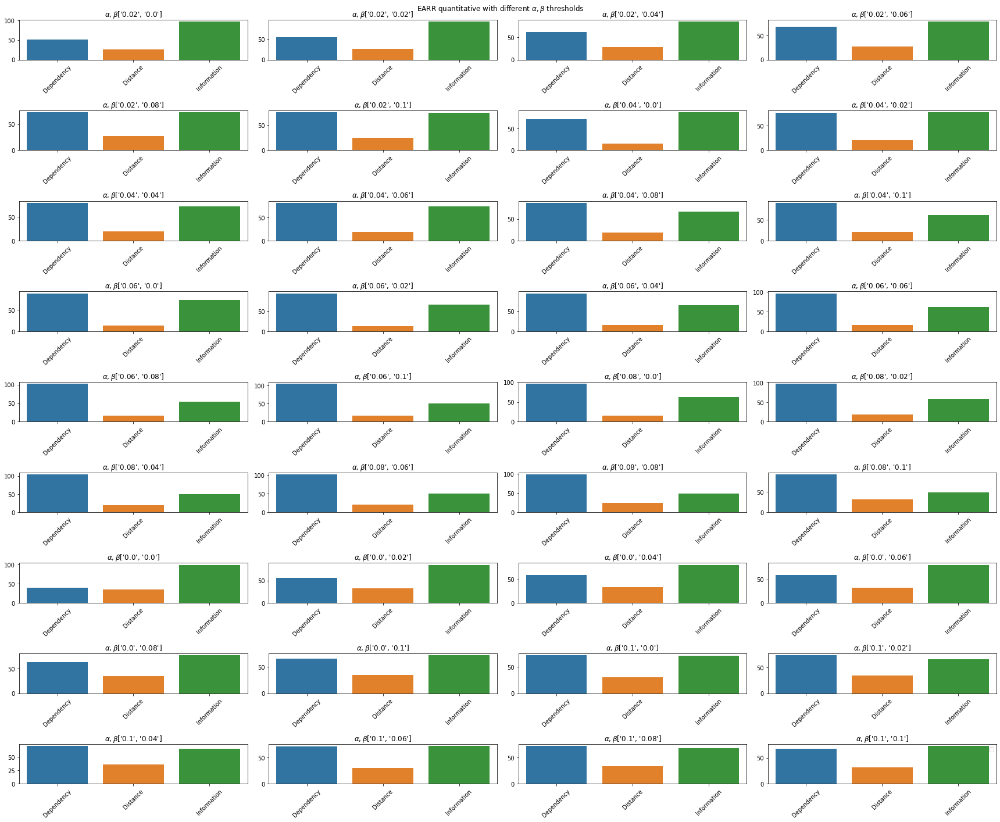

In [31]:

fig,axes  = plt.subplots(nrows=9, ncols=4, figsize=(24,20), tight_layout=True)
fig.suptitle('EARR quantitative with different '+r'$\alpha, \beta$'+' thresholds')

k=0
j = 0
allFiles = []

abs_path = os.getcwd()+'/optimalalphabeta/dearr_cont/'
for files in sorted(os.listdir(abs_path)):
    df = pd.read_csv(os.path.join(abs_path, files))
    x_ticks = df['FeatureAlgo'].value_counts().sort_index().index.tolist()
    sns.barplot(ax=axes[k][j], x=df['FeatureAlgo'].value_counts().sort_index().index.tolist(), 
    y=df['FeatureAlgo'].value_counts().sort_index().values.tolist()).set(title=r'$\alpha, \beta$' + '{}'.format(str(re.findall("\d+\.\d+", files))))
    axes[k][j].set_xticklabels(labels=x_ticks, rotation=45)
    #plt.title('FSA of {}'.format(str(re.findall("\d+\.\d+", files))))
   # plt.subplots_adjust(hspace=None)
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)

    j = j+1
    if(j==4):
        k=k+1
        j=0
plt.legend((df['FeatureAlgo'].value_counts().sort_index().index.tolist()), df['FeatureAlgo'].value_counts().sort_index().index.tolist())


#plt.tight_layout()

    #print(df['FeatureAlgo'].value_counts())